Apprentissage par Renforcement

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.neighbors import LocalOutlierFactor

plt.style.use('dark_background')  # 🕶️ Dark mode

In [2]:
import gymnasium as gym
import matplotlib.pyplot as plt

# Créer l'environnement avec affichage désactivé (mode image)
env = gym.make("LunarLander-v2", render_mode="rgb_array")
observation, info = env.reset(seed=42)

# Liste pour stocker les images
frames = []

for _ in range(100):
    action = env.action_space.sample()  # action aléatoire
    observation, reward, terminated, truncated, info = env.step(action)

    # Récupérer et stocker l’image de la simulation
    frame = env.render()
    frames.append(frame)

    if terminated or truncated:
        observation, info = env.reset()

env.close()


C:\Users\VISION TAG\Documents\project\ai\deep-learning\env\Lib\site-packages\pygame\pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists


In [3]:
#env = gym.make("LunarLander-v2", render_mode="human")

# hyper - parametres
alpha = 0.1
gamma = 0.99
epsilon = 1.0
epsilon_decay = 0.995
epsilon_min = 0.01
episodes = 1000
max_steps = 1000

In [4]:
# Decoupage de l'espace en plusieurs parties
state_bins = [np.linspace(-1.0, 1.0, 10) for _ in range(env.observation_space.shape[0])]

n_bins = tuple(len(bins) + 1 for bins in state_bins)
q_table = np.zeros(n_bins + (env.action_space.n,))

def discretize_state(state):
    return tuple(np.digitize(state[i], state_bins[i]) for i in range(len(state)))
    

In [5]:
from tqdm import tqdm


In [6]:
frames = []
rewards_list = []
best_episode = 0
best_reward = float('-inf')

for episode in tqdm(range(episodes)):
    state, _ = env.reset(seed=42)
    state = discretize_state(state)
    total_reward = 0
    new_frames = []  # Réinitialiser à chaque épisode

    for step in range(max_steps):
        # epsilon - greedy policy
        if np.random.uniform(0, 1) < epsilon:
            action = env.action_space.sample()  # exploration
        else:
            action = np.argmax(q_table[state])  # exploitation

        next_state, reward, terminated, truncated, _ = env.step(action)
        next_state = discretize_state(next_state)

        # Mise à jour Q-table (Bellman)
        old_value = q_table[state][action]
        next_max = np.max(q_table[next_state])
        new_value = (1 - alpha) * old_value + alpha * (reward + gamma * next_max)
        q_table[state][action] = new_value

        state = next_state
        total_reward += reward

        # Stocker frame
        frame = env.render()
        new_frames.append(frame)

        if terminated or truncated:
            break

    # Réduction d'epsilon
    if epsilon > epsilon_min:
        epsilon *= epsilon_decay

    rewards_list.append(total_reward)
    # Sauvegarde des meilleures frames
    if total_reward > best_reward:
        best_reward = total_reward
        best_episode = episode + 1
        frames = new_frames  # On remplace les anciennes frames

env.close()

print(f"🎯 Meilleure récompense : {best_reward} à l'épisode {best_episode}")


100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [26:00<00:00,  1.56s/it]

🎯 Meilleure récompense : 211.24815192935193 à l'épisode 561


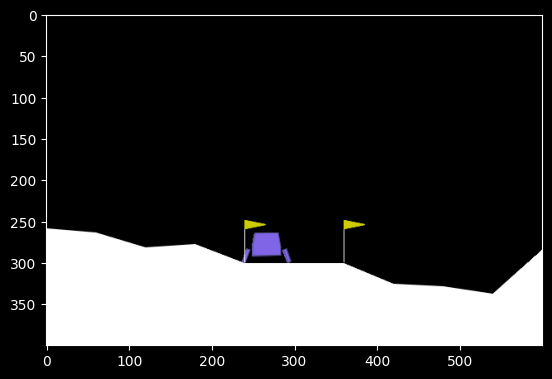

In [7]:
from matplotlib import animation
from IPython.display import HTML

# Créer une figure
fig = plt.figure()
img = plt.imshow(frames[0])

# Fonction de mise à jour de l'image pour chaque frame
def animate(i):
    img.set_array(frames[i])
    return [img]

# Créer l'animation
anim = animation.FuncAnimation(fig, animate, frames=len(frames), interval=50, blit=True)

# Afficher l'animation dans Jupyter
HTML(anim.to_jshtml())
